In [50]:
from keras.models import load_model
import matplotlib.pyplot as plt
from keras.preprocessing import image
import numpy as np
from keras import models
from keras.applications.vgg16 import VGG16
import matplotlib.pyplot as plt
%matplotlib inline
import keras.backend as K
from keras import *
from tqdm import tqdm
from keras.applications.vgg16 import preprocess_input, decode_predictions
import cv2

#Visualizing

In [2]:
#load model
model = load_model('/content/drive/MyDrive/cats_and_dogs_small_1.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

(1, 150, 150, 3)


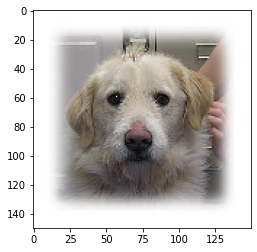

In [37]:
#load image
img_path = '/content/drive/MyDrive/Dataset/dog and cat/test1/3.jpg'
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)
plt.imshow(img_tensor[0])

(1, 148, 148, 32)


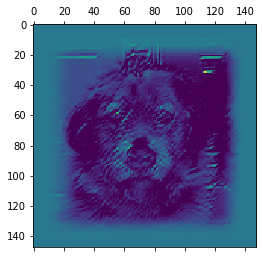

In [4]:
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

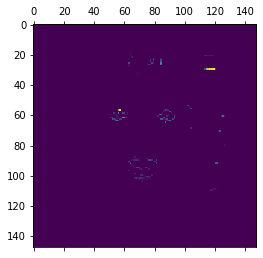

In [5]:
plt.matshow(first_layer_activation[0, :, :, 7], cmap='viridis')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


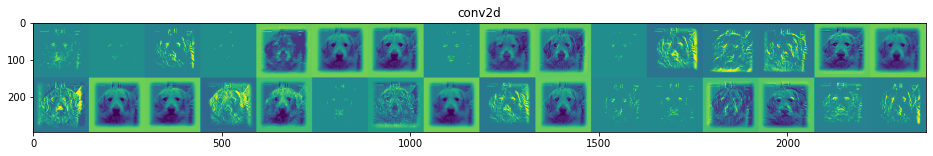

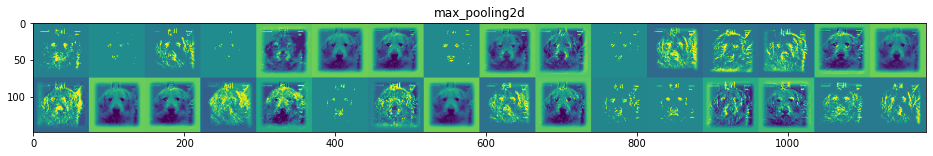

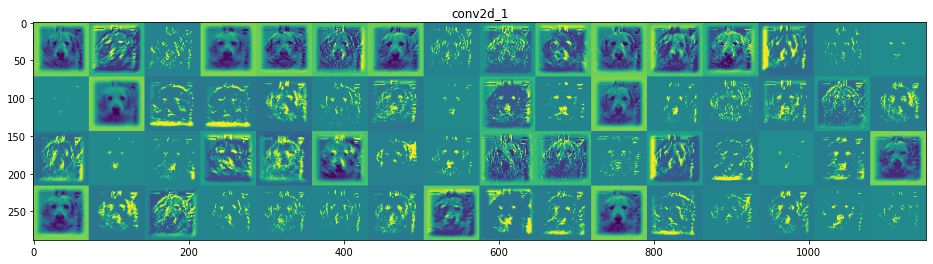

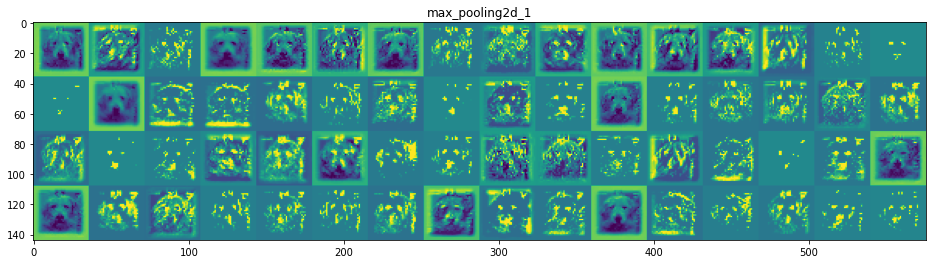

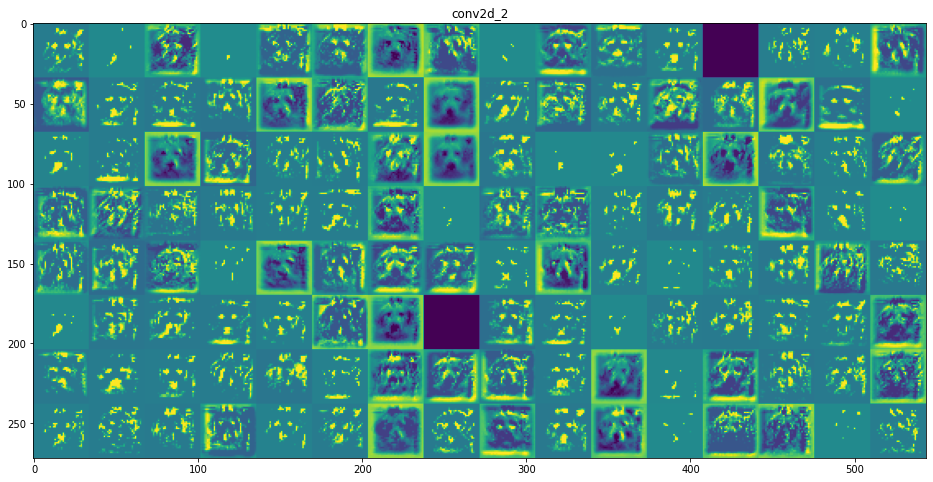

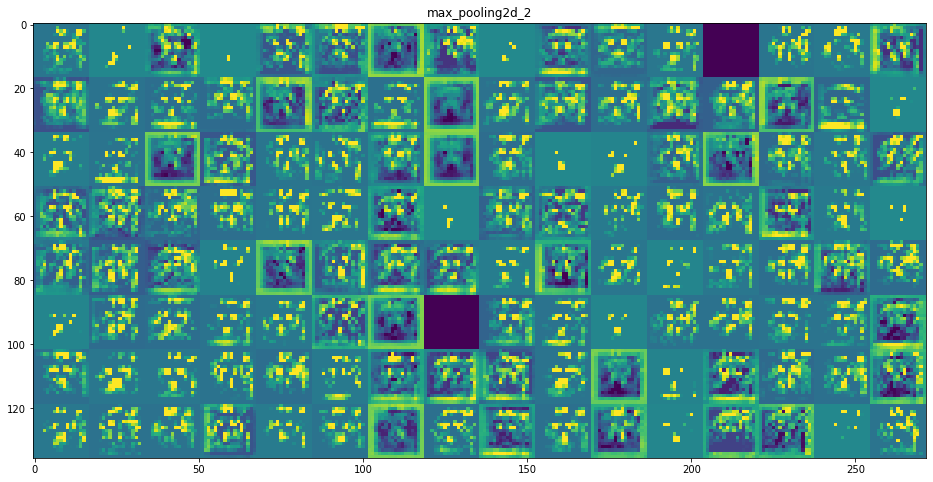

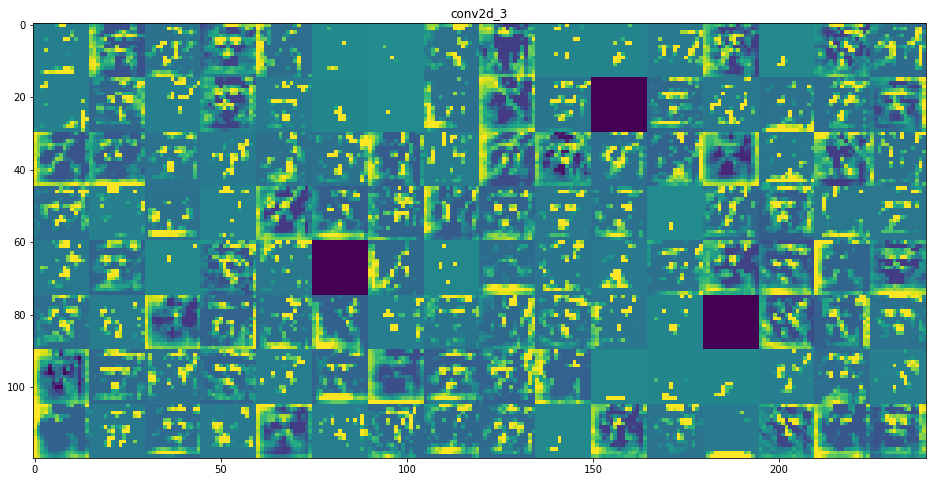

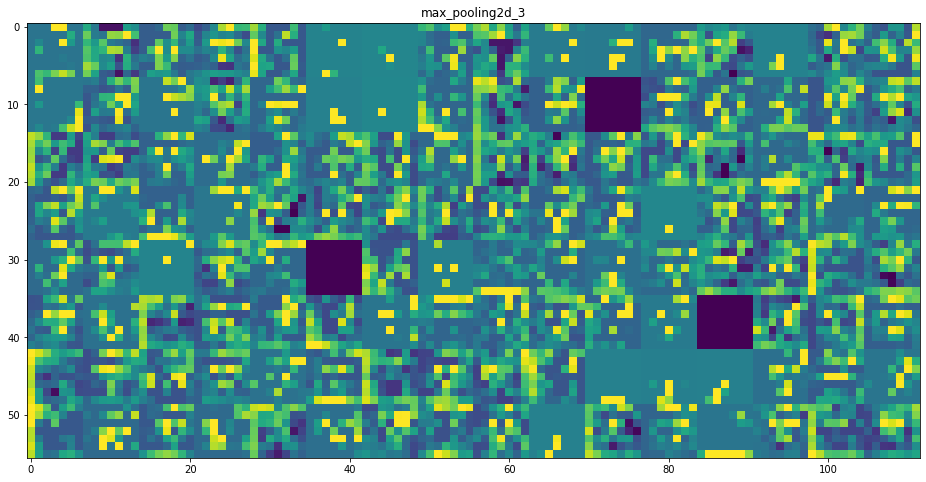

In [6]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                        row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

In [9]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()


model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

grads = K.gradients(loss, model.input)[0]

In [10]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [12]:
iterate = K.function([model.input], [loss, grads])
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [13]:
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.
step = 1.  
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

In [14]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [15]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)

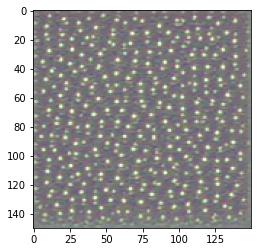

In [16]:
plt.imshow(generate_pattern('block3_conv1', 0))

100%|██████████| 4/4 [12:10<00:00, 182.71s/it]


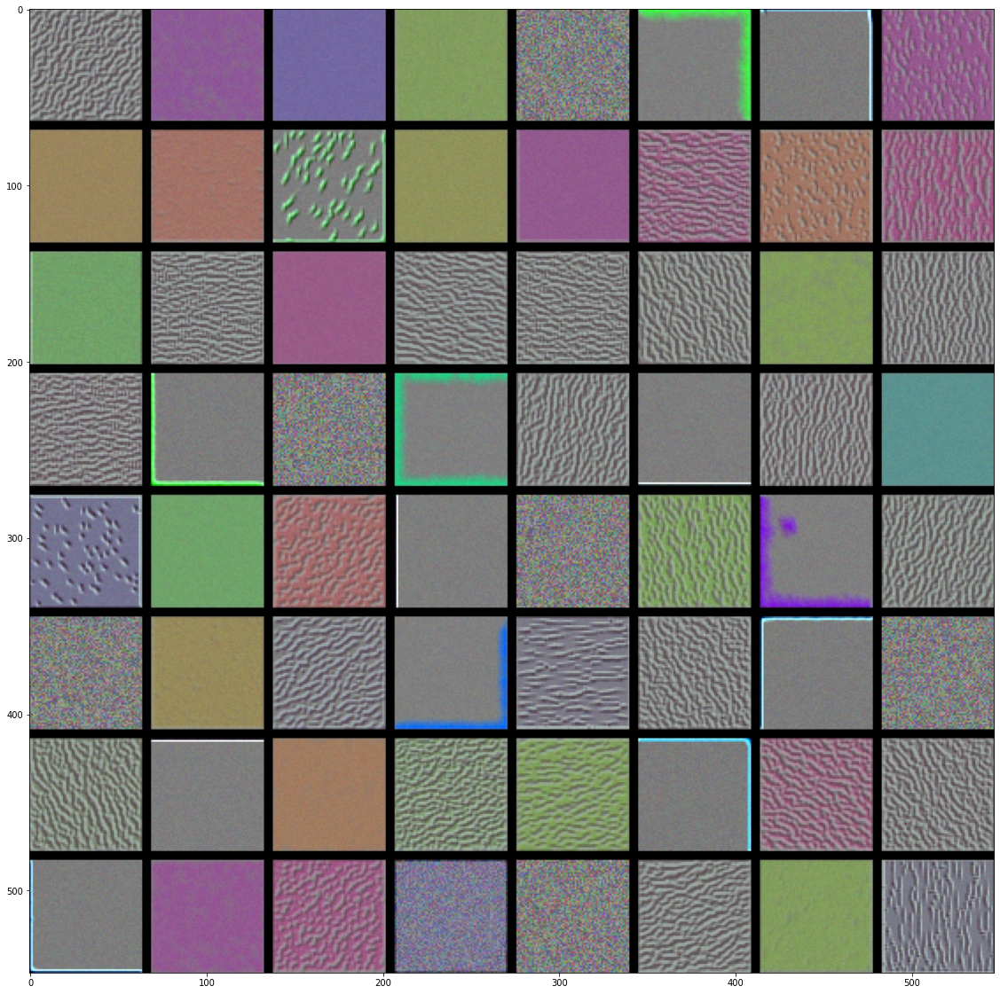

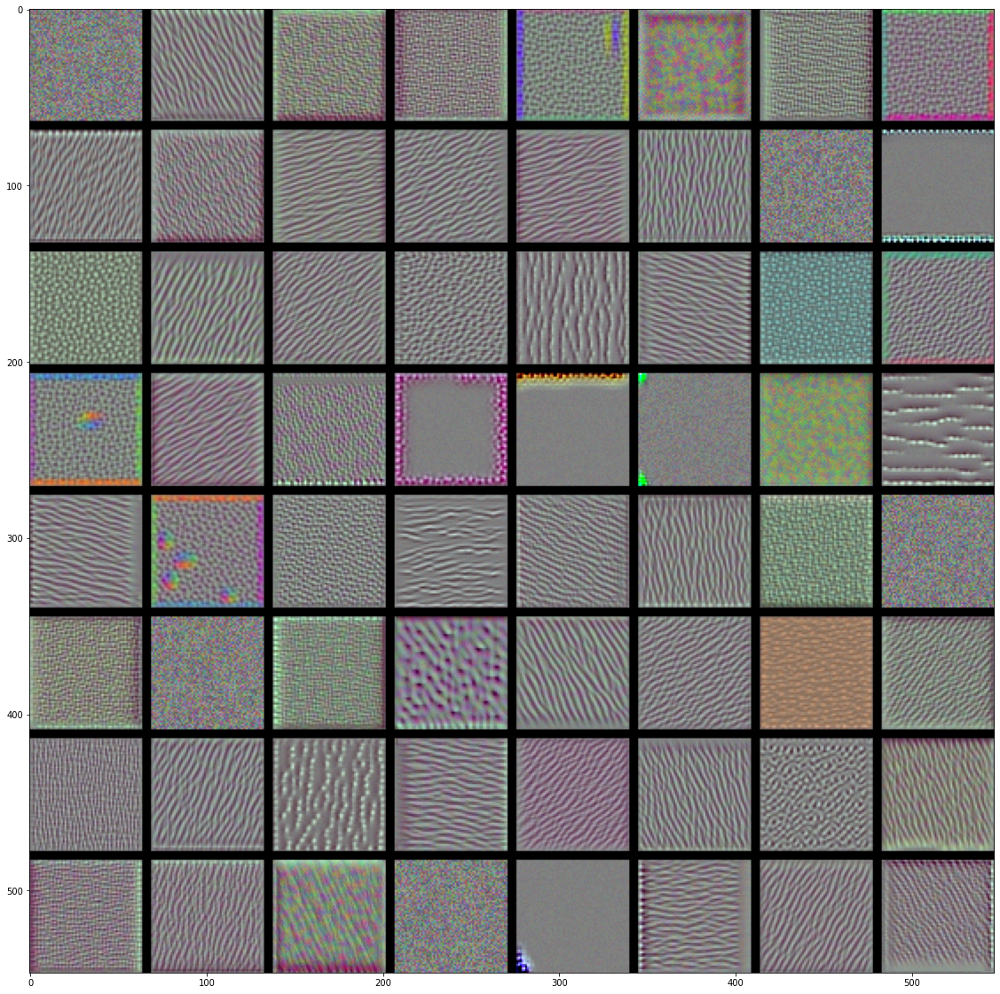

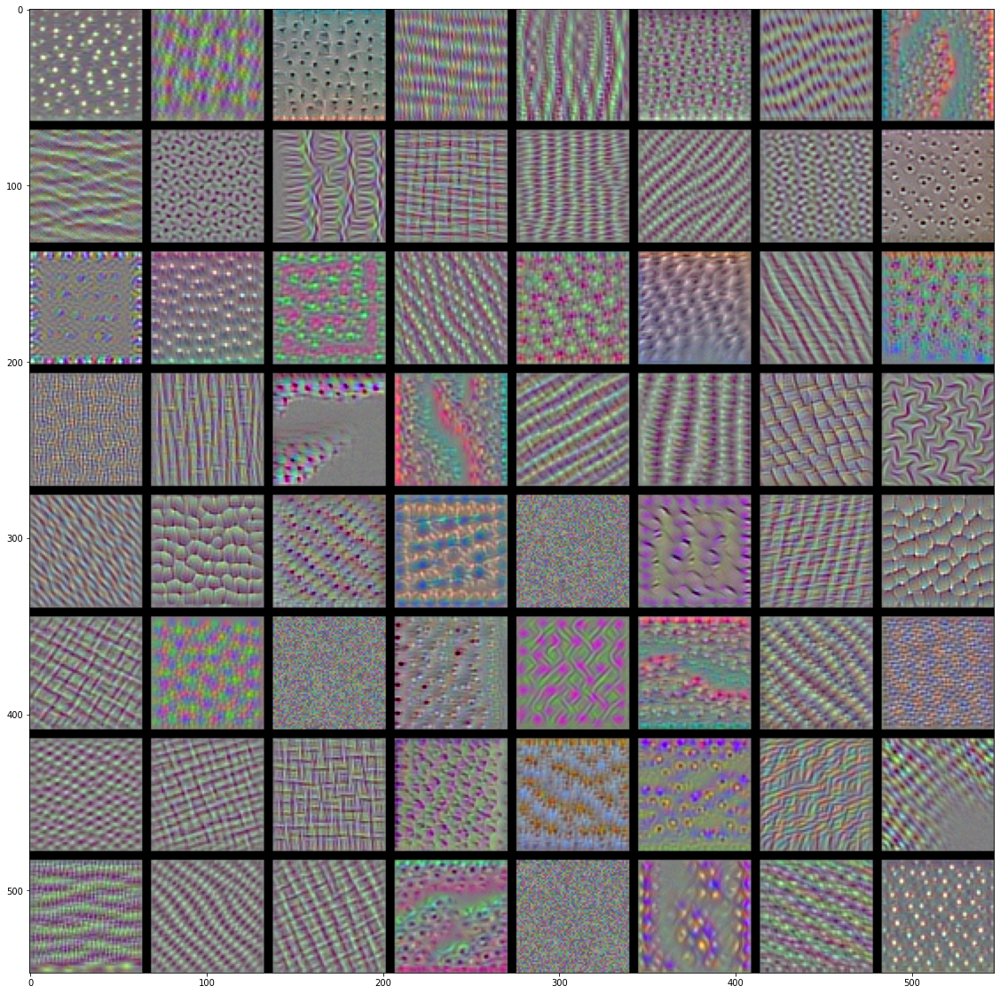

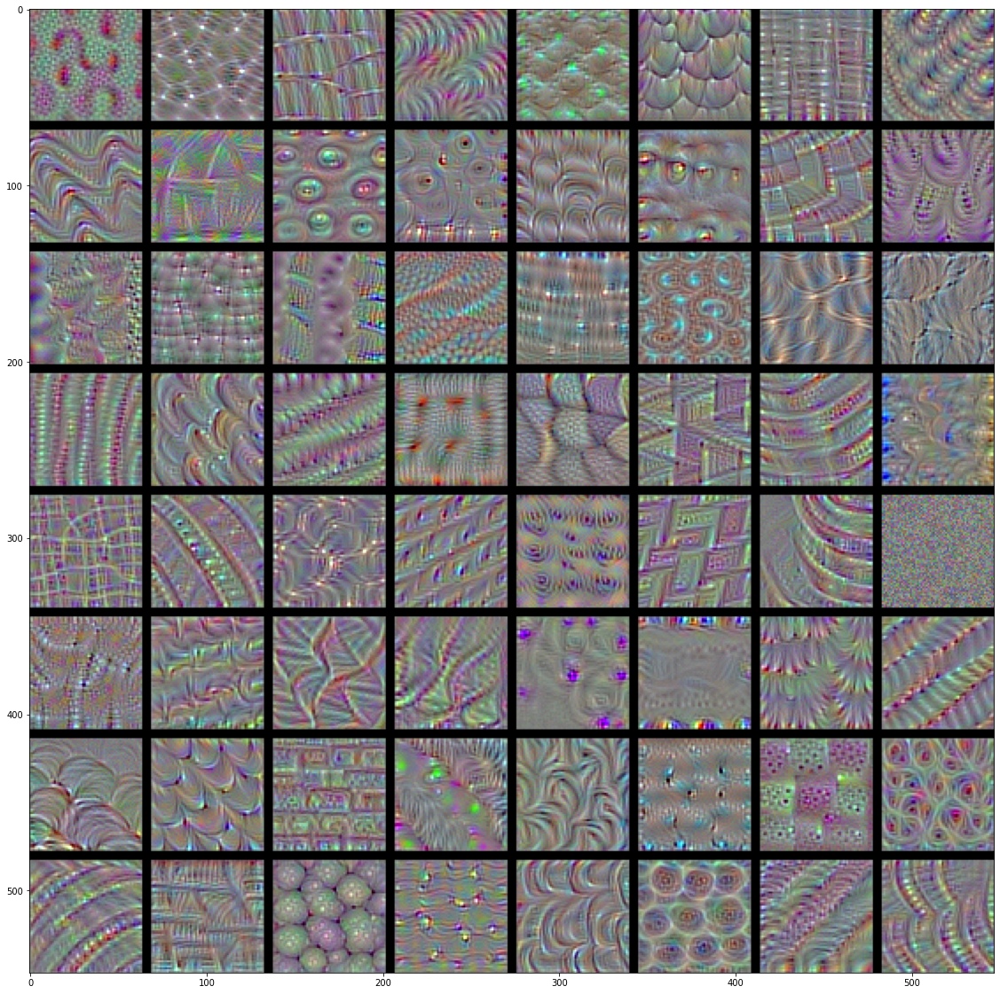

In [27]:
layer_name = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']

for z in tqdm(layer_name):
    size = 64
    margin = 5
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3)).astype('uint8')
    for i in range(8):  
        for j in range(8): 
            filter_img = generate_pattern(z, i + (j * 8), size=size)
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show

#heatmap

In [93]:
model = VGG16(weights='imagenet')

Predicted: [('n02099601', 'golden_retriever', 0.54507256), ('n02091635', 'otterhound', 0.21957764), ('n02101556', 'clumber', 0.06784789)]


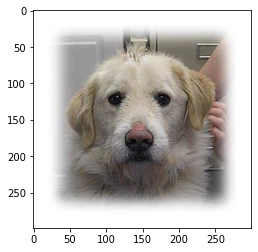

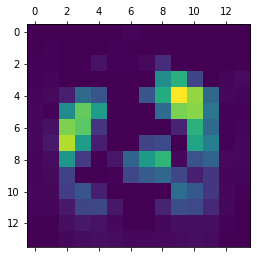

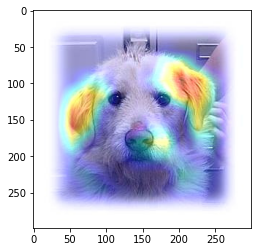

Predicted: [('n02085620', 'Chihuahua', 0.86802226), ('n02096177', 'cairn', 0.034410827), ('n02097658', 'silky_terrier', 0.012599441)]


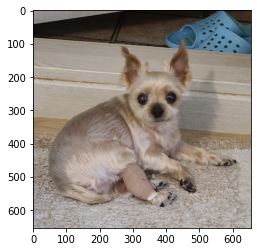

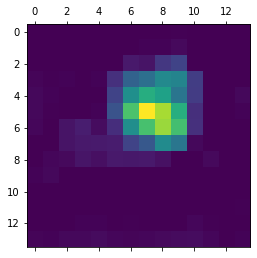

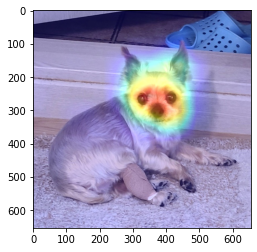

Predicted: [('n02123045', 'tabby', 0.28215462), ('n02123159', 'tiger_cat', 0.21240138), ('n02124075', 'Egyptian_cat', 0.13204183)]


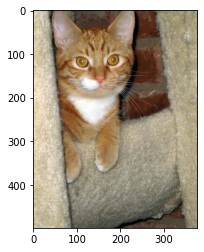

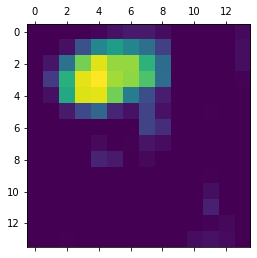

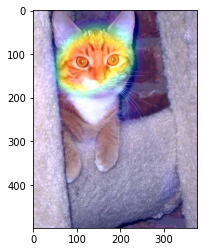

In [116]:
images = ['/content/drive/MyDrive/Dataset/dog and cat/test1/3.jpg','/content/drive/MyDrive/망네.jpeg','/content/drive/MyDrive/Dataset/dog and cat/test1/15.jpg']
for z in images:
    img = image.load_img(z, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    print('Predicted:', decode_predictions(preds, top=3)[0])

    img_original = image.load_img(z)
    plt.imshow(img_original)
    plt.show()

    size = np.argmax(preds[0])
    dogcat_output = model.output[:, size]
    last_conv_layer = model.get_layer('block5_conv3')
    grads = K.gradients(dogcat_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([x])
    for i in range(512):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    plt.matshow(heatmap)
    plt.show()

    img = cv2.imread(z)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * 0.4 + img
    cv2.imwrite('new.jpg', superimposed_img)
    img = image.load_img('new.jpg')
    plt.imshow(img)
    plt.show()